# EVO 7

In [1]:
# import packages
import h5py # read h5

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime
from matplotlib import rc
from cycler import cycler

import numpy as np
import pandas as pd

from merge_h5_files import merge_preserve_time
import os
import glob
from tomlkit import date


# Figure format
rc = {'axes.facecolor':'white',
      'figure.figsize': (12, 6),
      'savefig.dpi': 600,
#       'axes.grid' : False,
      'axes.edgecolor' : '0.15',
      
      'font.family':'Times New Roman',
      'font.serif': ['Times New Roman', 'Times', 'STIXGeneral'],  # 备选
      # —— 数学字体（$...$ 内）——
      'mathtext.fontset': 'stix',     # 关键：让 μ、ε 等用 STIX（Times 风格）
      'axes.unicode_minus': False,    # 让负号显示为正常的连字符


      'axes.labelsize': 20,         # X、Y 轴标题字体
      'axes.labelweight': 'bold',   # X、Y 轴标题加粗
      'xtick.labelsize': 20,        # X轴刻度文字
      'ytick.labelsize': 20,        # Y轴刻度文字
      'legend.fontsize': 20,       # 图例字体

      # 线宽与颜色顺序
      'lines.linewidth': 2.25,      # 所有线条默认 2.25 pt
      'axes.prop_cycle': cycler('color', list(('k', 'r', 'b', 'g', 'm', 'c', 'y'))),

      # 刻度朝外 & 粗细
      'xtick.direction': 'out',
      'ytick.direction': 'out',
      'xtick.major.size': 6,
      'ytick.major.size': 6,
      'xtick.major.width': 2.0,
      'ytick.major.width': 2.0,

      # 坐标轴（内框）线宽
      'axes.linewidth': 2.0,
      } 
# lack of font size
plt.rcParams.update(rc)

In [2]:
# Read h5 files
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/Zgabay A14H - flowback - strain change.h5','r')
f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/strain_change_washed.h5','r')

print(list(f1.keys()))
# 继续进入下一层
# data_group = f1['data']

dstrain = (f1['strain_corrected'])  #（time, depth）
# dstrain = (f1['data'])  #（time, depth）
depth = (f1['depth'])
date_str = (f1['stamps'])
# date_utc = (f1['stamps_unix'])


depth = np.asarray(depth)
dstrain = np.asarray(dstrain)
date_str = np.asarray(date_str)
# date_utc = np.asarray(date_utc)


['depth', 'first_slip_neg_t', 'first_slip_pos_t', 'first_spike_neg_t', 'first_spike_pos_t', 'n_slip_neg', 'n_slip_pos', 'n_spike_neg', 'n_spike_pos', 'rate_corrected', 'slippage_flag', 'spike_flag', 'stamps', 'strain_corrected']


## loop

targets: 13100.3
targets:     13100.3
idx:         [39600]
depth_near:  [13100.37]
error(ft):   [-0.0703125]
0       True
1       True
2       True
3       True
4       True
        ... 
3410    True
3411    True
3412    True
3413    True
3414    True
Length: 3415, dtype: bool


C:\Users\fengxiang.mao\AppData\Local\Temp\ipykernel_14788\396985836.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,5))


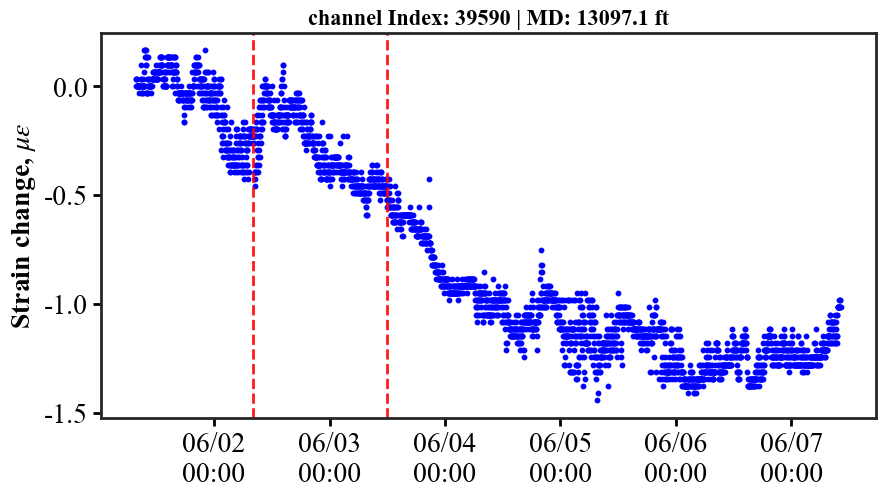

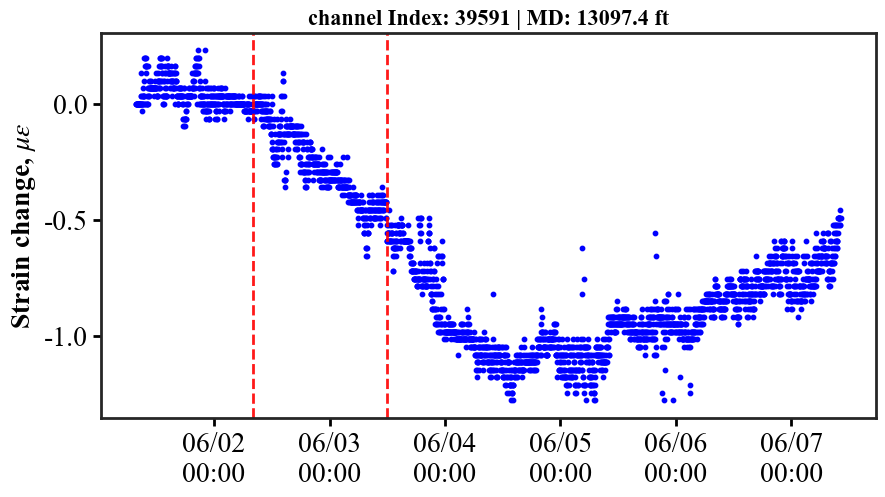

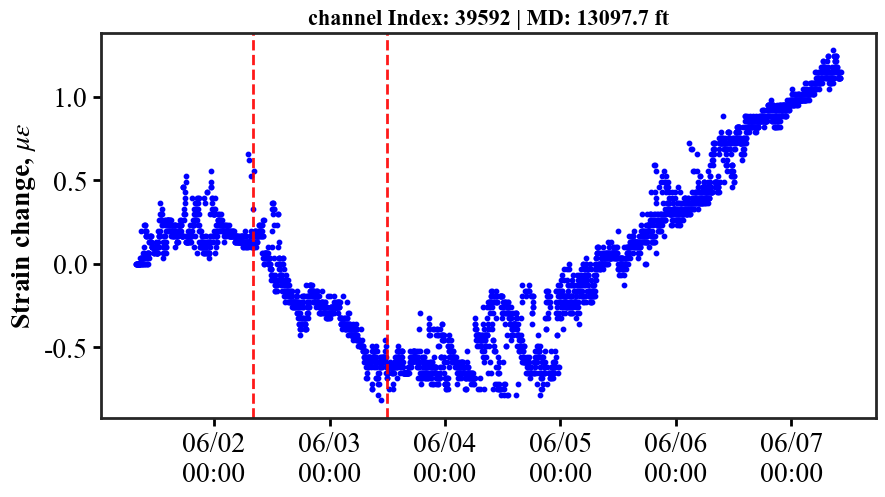

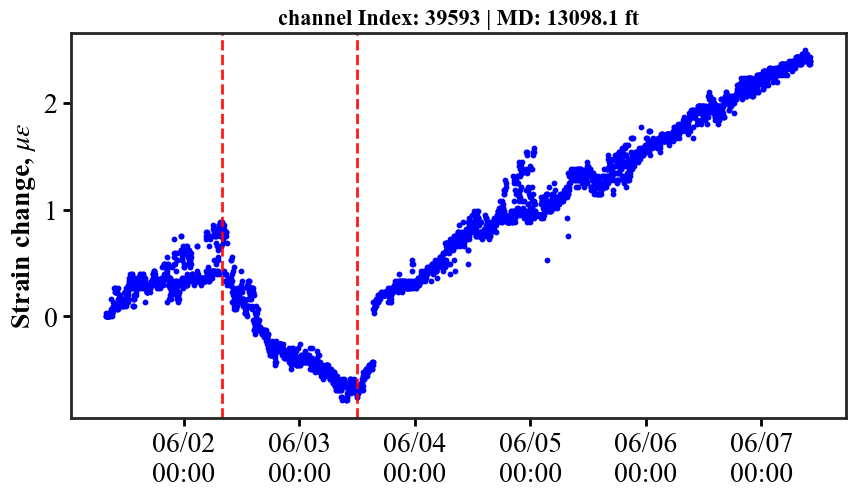

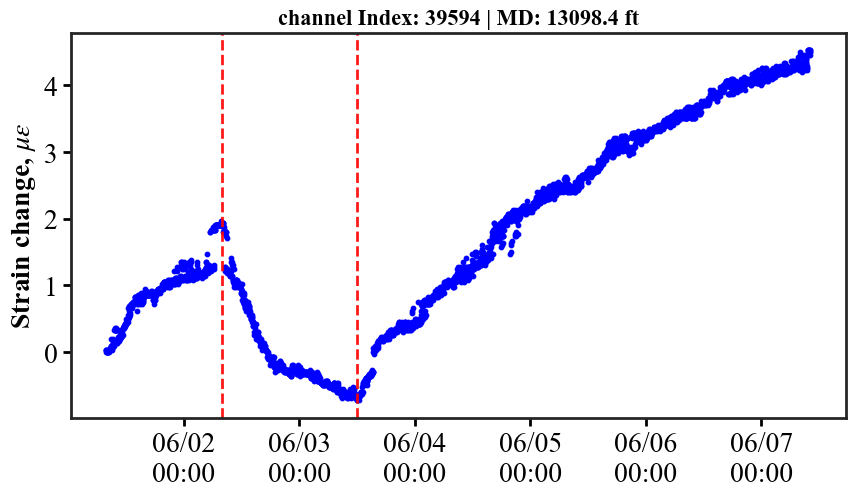

...

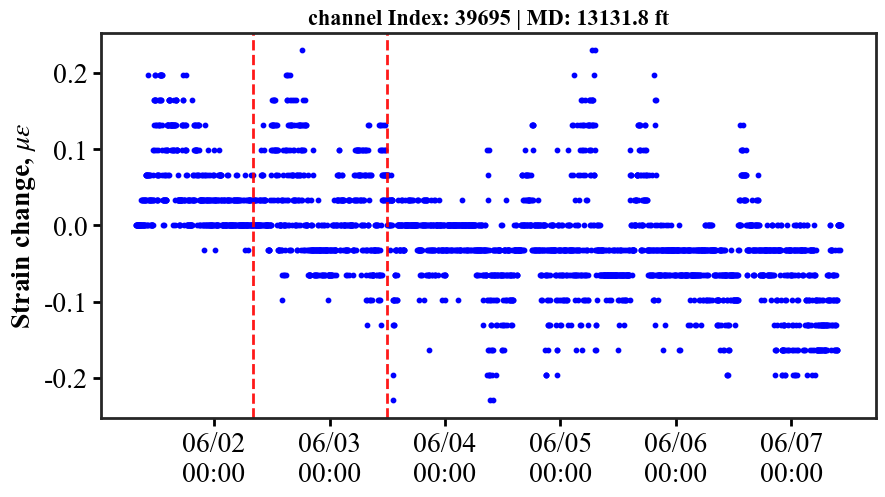

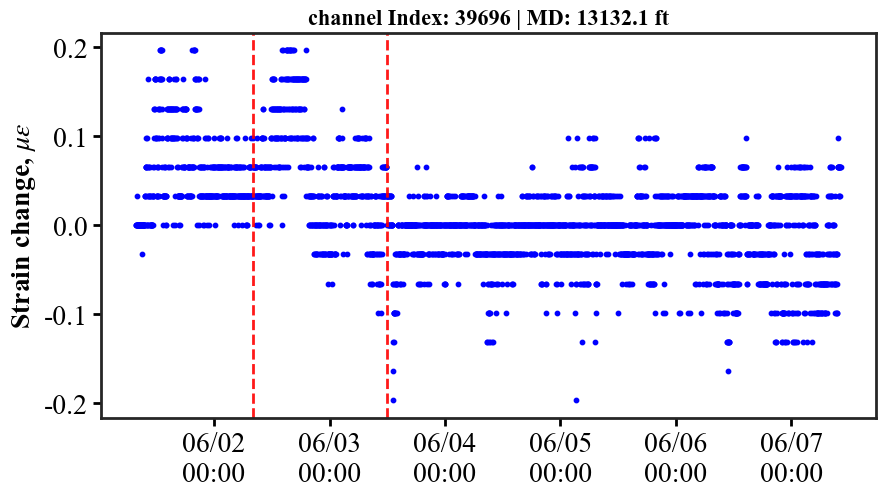

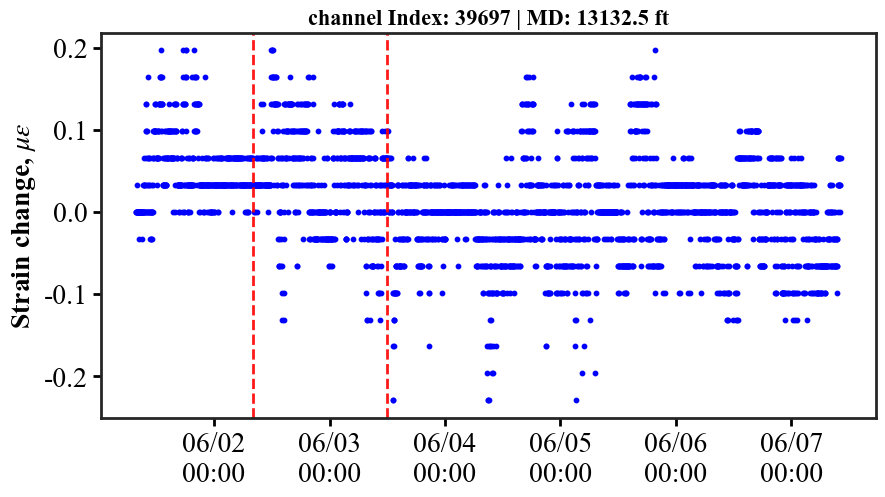

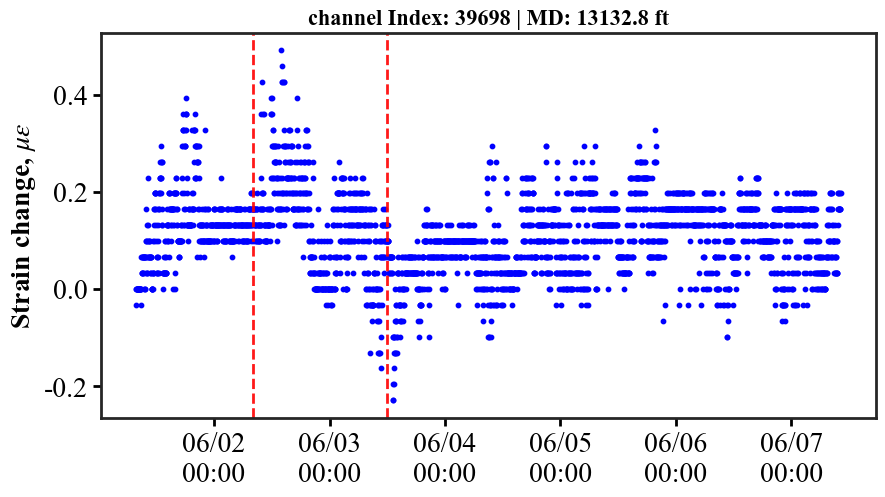

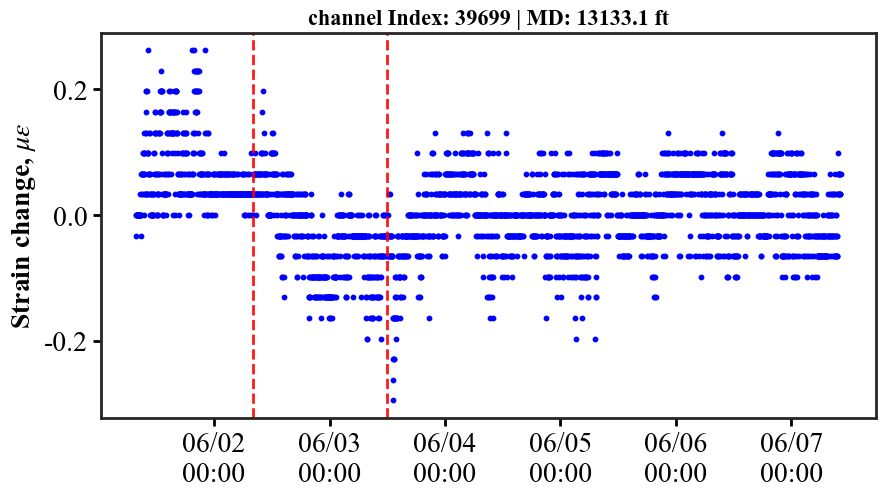

In [4]:

def nearest_col_indices(depth_1d, targets):
    """
    targets 可以是标量或数组。返回与每个 target 最近的列索引。
    """
    t = np.atleast_1d(targets).astype(float)
    # 计算 |depth - target| 并在列轴上取最小
    idx = np.argmin(np.abs(depth_1d[None, :] - t[:, None]), axis=1)
    return idx

pop_channels = np.array([38394, 38449, 38944, 41251, 41570, 42057, 42069, 42085, 43139, 43170,
                         43221, 43245, 43961, 44955, 45000, 45768, 45809, 46738, 47454, 47650, 49911])

flowback_depth = np.array([12660.7, 12678.9, 12842.0, 13602.8, 13707.7, 13868.5, 13872.4, 13877.7, 14225.1, 14235.4, 
                           14252.2, 14260.2, 14496.4, 14824.2, 14838.8, 15092.2, 15105.7, 15412.1, 15648.3, 15712.8,
                           16458.4])
targets = flowback_depth[2]
targets = 13100.3


# targets = 13004
print("targets:", targets)
idx = nearest_col_indices(depth, targets)
depth_near = depth[idx]
err = targets - depth_near

print("targets:    ", targets)
print("idx:        ", idx)
print("depth_near: ", depth_near)
print("error(ft):  ", err)

ds = pd.to_datetime(pd.Series(date_str.astype(str)), format='%m/%d/%Y %H:%M:%S.%f')
# print(type(ds))
# print(ds)

#取部分数据进行绘图

# ---- 3) 设定你要显示的时间段（同一时区！）----
start = pd.Timestamp("2022-06-01 07:00:00")
end   = pd.Timestamp("2022-06-07 11:00:00")


# start = pd.Timestamp("2022-06-02 08:00:00")
# end   = pd.Timestamp("2022-06-02 16:00:00")
# end   = pd.Timestamp("2022-06-03 08:00:00")

# start = datetime.datetime(2022, 3, 15, 9, 0)
# end = datetime.datetime(2022, 3, 15, 17, 0)
# end   = datetime.datetime(2022, 3, 21, 19, 0)


mask = (ds >= start) & (ds <= end)
# mask = np.ones(len(ds), dtype=bool)

t_sel    = ds[mask]
print(mask)


# idx 是数组 -> 先变标量
idx0 = int(idx[0])   # 或者 idx0 = int(np.squeeze(idx))


for i in range(-10 , 100, 1):   # -50 到 +50
    idx_new = idx0  + i 
        # 防止越界（很重要）
    if idx_new < 0 or idx_new >= depth.size:
        continue
    depth_ft = float(depth[idx_new])  # 该 channel 对应的深度(ft)

    cols = dstrain[:, idx_new]                 # shape = (N_time, len(targets)) 
    cols = 1 * cols
    # print("idx-i:", idx-i)
    # length = len(cols)
    # print(f"读取 {length} 条记录")
    # print("cols", cols)

    strian_sel = cols[mask]
    strian_sel = strian_sel - strian_sel[0]  # 以起始点为零点
    fig, ax = plt.subplots(figsize=(10,5))

    #   scatter plot
    ax.scatter(t_sel, strian_sel, color='blue', s=10, label='Field Pressure Data')
    # ax.plot(t_sel, strian_sel, color='blue', lw = 2, label='Field Pressure Data')

    ax.xaxis_date()
    date_format = mdates.DateFormatter('%m/%d\n%H:%M')
    ax.xaxis.set_major_formatter(date_format)
    # 设置主刻度间隔为 1 小时
    # ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
    #图例显示index
    # ax.set_title(f'channel Index: {idx_new}', fontsize=16, fontweight='bold')
    #  标题同时显示 index + 深度
    ax.set_title(f'channel Index: {idx_new} | MD: {depth_ft:.1f} ft', fontsize=16, fontweight='bold')
    ax.set_ylabel(r'Strain change, $\mu\varepsilon$')
    
    t1 = pd.to_datetime("2022-06-02 08:00:00")
    t2 = pd.to_datetime("2022-06-03 12:00:00")

    ax.axvline(t1, linestyle="--", linewidth=2, alpha=0.9, color='red')
    ax.axvline(t2, linestyle="--", linewidth=2, alpha=0.9, color='red')




## draw in the same plot

(3415, 57204)


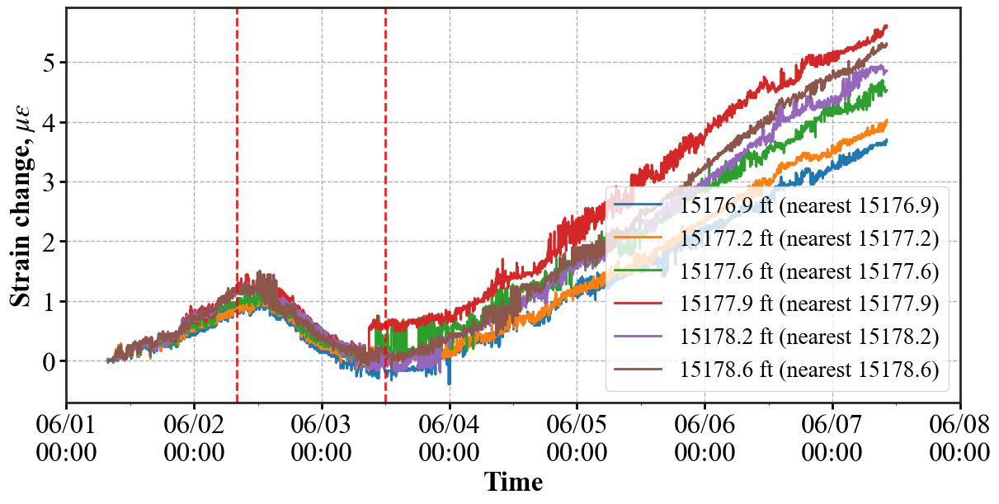

In [5]:
%reload_ext autoreload
%autoreload 2

from turtle import color
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from plot_style import plot_strain_vs_time_at_depths, decode_stamps_to_datetimeindex, save_figure
from matplotlib.ticker import MultipleLocator, FuncFormatter, MaxNLocator, ScalarFormatter, FixedLocator, LogFormatter
from dateutil.rrule import rrule, HOURLY, DAILY


# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 3 (refrac)/Neubrex_DSS_strain/Zgabay A14H - refrac - strain change.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/Zgabay A14H - flowback - strain change rate.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/Zgabay A14H - flowback - strain change.h5','r')
f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5','r')


# dstrain = (f1['data'])
dstrain = (f1['strain_corrected'])

depth = (f1['depth'])
date_plot = (f1['stamps'])

print(dstrain.shape)  # (时间点数, 深度点数)
# （可选）把 stamps 转为 DatetimeIndex，便于时间戳就近匹配
stamps_idx = decode_stamps_to_datetimeindex(date_plot, fmt='%m/%d/%Y %H:%M:%S.%f') if date_plot is not None else None

#=======================target depth=========V1=========
# # 目标深度
# z0 = 12859.5
# D = np.asarray(depth[...]) if hasattr(depth, "__getitem__") else np.asarray(depth)

# # 找到最接近 z0 的深度列索引
# j0 = int(np.argmin(np.abs(D - z0)))

# # 取上下各 25 个索引（含中间，共 51 条）
# half = 5
# j_start = max(0, j0 - half)
# j_end   = min(len(D) - 1, j0 + half)

# # 用这些“真实深度值”作为 target_depths（这样每条线都会命中对应列）
# depth_range = D[j_start:j_end+1]

# # legend 太长的话建议关掉或只标少数
# legend_labels = [""] * len(depth_range)
# legend_labels[j0 - j_start] = f"nearest {D[j0]:.1f} ft"

#=======================target depth=========V2=========
# z0 = 12859.5
# D = np.asarray(depth[...]) if hasattr(depth, "__getitem__") else np.asarray(depth)

# j0 = int(np.argmin(np.abs(D - z0)))          # 最近列索引
# j_end = min(len(D) - 1, j0 + 4)              # 只取当前 + 下4个

# depth_range = D[j0:j_end+1]                  # 5个深度（或靠近边界时少于5个）
# legend_labels = [f"{d:.1f} ft" for d in depth_range]

# print("target:", z0, "nearest:", D[j0], "index:", j0, "depths:", depth_range)


#======================= target channels========

# 你指定的起始 channel（列索引）
j0 = 45877 # 这里换成你想用的 channel index
n_follow = 5

D = np.asarray(depth[...]) if hasattr(depth, "__getitem__") else np.asarray(depth)

j_end = min(len(D) - 1, j0 + n_follow)
channels = np.arange(j0, j_end + 1)

depth_range = D[channels]                         # 这些 channel 对应的真实深度值
legend_labels = [f"ch {j} ({D[j]:.1f} ft)" for j in channels]




fig, ax = plot_strain_vs_time_at_depths(
    dstrain, depth,
    stamps_index=stamps_idx,
    target_depths=depth_range,
    time_window=("2022-06-01 00:00:00", "2022-06-07 12:00:00"),  # 也可用行号：(500, 1500)
    scale=1.0,                        # 要换单位直接传 1e6 -> microstrain
    strain_unit="(microstrain)",
    figsize=(12, 6), grid=True, legend='auto',
    time_format='%m/%d\n %H:%M',   # ← 这里
    # time_tick_rotation=0,
    # legend_labels=[f"{d} ft" for d in depth_range],
    legend_labels = legend_labels

    # ["index 7", "index 8", "index 9", "index 10", "index 11", "index 12", "index 13", "index 14", "index 15", "index 16",]
    # 可选：自定义图例  ["12500 ft", "16000 ft"]
)

# 把所有曲线线宽改成 3
for ln in ax.lines:
    ln.set_linewidth(2.0)   # 你想多粗就写多少
#     ln.set_color('blue')  # 你想要的颜色

# for ln in ax.lines:
#     ln.set_linestyle('None')  # 不连线
#     ln.set_marker('o')        # 点形状：'o', '.', 'x', '^'...
#     ln.set_markersize(2)      # 点大小
#     ln.set_markerfacecolor('blue')  # 点填充色
#     ln.set_markeredgecolor('blue')  # 点边框色

# 重新生成 legend（最稳）
leg = ax.get_legend()
if leg is not None:
    leg.remove()

ax.legend(loc="best", ncol=1)



xmin = pd.to_datetime("2022-06-01 00:00:00")
xmax = pd.to_datetime("2022-06-08 00:00:00")
ax.set_xlim(xmin, xmax)


t1 = pd.to_datetime("2022-06-02 08:00:00")
t2 = pd.to_datetime("2022-06-03 12:00:00")

ax.axvline(t1, linestyle="--", linewidth=2, alpha=0.9, color='red')
ax.axvline(t2, linestyle="--", linewidth=2, alpha=0.9, color='red')



tick_start = pd.to_datetime("2022-06-01 00:00:00")
interval_hours = 24

rule = mdates.rrulewrapper(
    HOURLY,
    interval=interval_hours,
    dtstart=tick_start.to_pydatetime()
)
ax.xaxis.set_major_locator(mdates.RRuleLocator(rule))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d\n%H:%M'))

# set minor locator
ax.xaxis.set_minor_locator(mdates.HourLocator(interval=12))




# ax.xaxis.set_major_locator(MaxNLocator(nbins=7))
# ax.xaxis.set_major_locator(mdates.HourLocator(interval=12))
# ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))

# 将y轴翻转：
# ax.invert_yaxis()
# ax.set_ylim(-1, 13)

ax.legend(loc='lower right', ncol=1) #'upper left'
# let legend located out the plot
# ax.legend(loc='upper right', ncol=2,fontsize=14)

ax.grid(True,  linestyle='--')


# leg = ax.get_legend()
# if leg is not None:
#     leg.remove()

# handles, _ = ax.get_legend_handles_labels()
# ax.legend(handles, [f"{d} ft" for d in depth_range], loc='lower right', ncol=1)

# y轴标签
# ax.set_ylabel(r'Strain change, $\mu\varepsilon$')
# save_figure:
# save_figure(fig, 'strain_vs_time_13753ft.png', dpi=600, transparent=False)


# EVO 5

In [9]:
# import packages
import h5py # read h5

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime
from matplotlib import rc
from cycler import cycler

import numpy as np
import pandas as pd

from merge_h5_files import merge_preserve_time
import os
import glob
from tomlkit import date


# Figure format
rc = {'axes.facecolor':'white',
      'figure.figsize': (12, 6),
      'savefig.dpi': 600,
#       'axes.grid' : False,
      'axes.edgecolor' : '0.15',
      
      'font.family':'Times New Roman',
      'font.serif': ['Times New Roman', 'Times', 'STIXGeneral'],  # 备选
      # —— 数学字体（$...$ 内）——
      'mathtext.fontset': 'stix',     # 关键：让 μ、ε 等用 STIX（Times 风格）
      'axes.unicode_minus': False,    # 让负号显示为正常的连字符


      'axes.labelsize': 20,         # X、Y 轴标题字体
      'axes.labelweight': 'bold',   # X、Y 轴标题加粗
      'xtick.labelsize': 20,        # X轴刻度文字
      'ytick.labelsize': 20,        # Y轴刻度文字
      'legend.fontsize': 20,       # 图例字体

      # 线宽与颜色顺序
      'lines.linewidth': 2.25,      # 所有线条默认 2.25 pt
      'axes.prop_cycle': cycler('color', list(('k', 'r', 'b', 'g', 'm', 'c', 'y'))),

      # 刻度朝外 & 粗细
      'xtick.direction': 'out',
      'ytick.direction': 'out',
      'xtick.major.size': 6,
      'ytick.major.size': 6,
      'xtick.major.width': 2.0,
      'ytick.major.width': 2.0,

      # 坐标轴（内框）线宽
      'axes.linewidth': 2.0,
      } 
# lack of font size
plt.rcParams.update(rc)

In [10]:
# Read h5 files
f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/Zgabay A14H - flowback - strain change.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/strain_change_washed.h5','r')

print(list(f1.keys()))
# 继续进入下一层
# data_group = f1['data']

# dstrain = (f1['strain_corrected'])  #（time, depth）
dstrain = (f1['data'])  #（time, depth）
depth = (f1['depth'])
date_str = (f1['stamps'])
# date_utc = (f1['stamps_unix'])


depth = np.asarray(depth)
dstrain = np.asarray(dstrain)
date_str = np.asarray(date_str)
# date_utc = np.asarray(date_utc)


['data', 'depth', 'stamps', 'stamps_unix']


## loop

In [ ]:

def nearest_col_indices(depth_1d, targets):
    """
    targets 可以是标量或数组。返回与每个 target 最近的列索引。
    """
    t = np.atleast_1d(targets).astype(float)
    # 计算 |depth - target| 并在列轴上取最小
    idx = np.argmin(np.abs(depth_1d[None, :] - t[:, None]), axis=1)
    return idx

pop_channels = np.array([38394, 38449, 38944, 41251, 41570, 42057, 42069, 42085, 43139, 43170,
                         43221, 43245, 43961, 44955, 45000, 45768, 45809, 46738, 47454, 47650, 49911])

flowback_depth = np.array([12660.7, 12678.9, 12842.0, 13602.8, 13707.7, 13868.5, 13872.4, 13877.7, 14225.1, 14235.4, 
                           14252.2, 14260.2, 14496.4, 14824.2, 14838.8, 15092.2, 15105.7, 15412.1, 15648.3, 15712.8,
                           16458.4])
targets = flowback_depth[2]
targets = 16445.1

# targets = 13004
print("targets:", targets)
idx = nearest_col_indices(depth, targets)
depth_near = depth[idx]
err = targets - depth_near

print("targets:    ", targets)
print("idx:        ", idx)
print("depth_near: ", depth_near)
print("error(ft):  ", err)

ds = pd.to_datetime(pd.Series(date_str.astype(str)), format='%m/%d/%Y %H:%M:%S.%f')
# print(type(ds))
# print(ds)

#取部分数据进行绘图

# ---- 3) 设定你要显示的时间段（同一时区！）----
start = pd.Timestamp("2022-03-14 20:30:00")
# end   = pd.Timestamp("2022-03-21 18:30:00")
# end   = pd.Timestamp("2022-03-15 17:00:00")
end   = pd.Timestamp("2022-03-17 00:00:00")



# start = pd.Timestamp("2022-06-02 08:00:00")
# end   = pd.Timestamp("2022-06-02 16:00:00")
# end   = pd.Timestamp("2022-06-03 08:00:00")

# start = datetime.datetime(2022, 3, 15, 9, 0)
# end = datetime.datetime(2022, 3, 15, 17, 0)
# end   = datetime.datetime(2022, 3, 21, 19, 0)

mask = (ds >= start) & (ds <= end)
# mask = np.ones(len(ds), dtype=bool)
t_sel    = ds[mask]
print(mask)
# idx 是数组 -> 先变标量
idx0 = int(idx[0])   # 或者 idx0 = int(np.squeeze(idx))

for i in range(-5 , 150, 1):   # -50 到 +50
    idx_new = idx0  + i 
        # 防止越界（很重要）
    if idx_new < 0 or idx_new >= depth.size:
        continue
    depth_ft = float(depth[idx_new])  # 该 channel 对应的深度(ft)

    cols = dstrain[:, idx_new]                 # shape = (N_time, len(targets)) 
    cols = 1 * cols
    # print("idx-i:", idx-i)
    # length = len(cols)
    # print(f"读取 {length} 条记录")
    # print("cols", cols)

    strian_sel = cols[mask]
    strian_sel = strian_sel - strian_sel[0]  # 以起始点为零点
    fig, ax = plt.subplots(figsize=(10,5))

    #   scatter plot
    ax.scatter(t_sel, strian_sel, color='blue', s=5, label='Field Pressure Data')
    # ax.plot(t_sel, strian_sel, color='blue', lw = 2, label='Field Pressure Data')

    ax.xaxis_date()
    date_format = mdates.DateFormatter('%m/%d\n%H:%M')
    ax.xaxis.set_major_formatter(date_format)
    # 设置主刻度间隔为 1 小时
    # ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
    #图例显示index
    # ax.set_title(f'channel Index: {idx_new}', fontsize=16, fontweight='bold')
    #  标题同时显示 index + 深度
    ax.set_title(f'channel Index: {idx_new} | MD: {depth_ft:.1f} ft', fontsize=16, fontweight='bold')
    ax.set_ylabel(r'Strain change, $\mu\varepsilon$')
    
    t1 = pd.to_datetime("2022-03-15 09:00:00")
    t1_2 = pd.to_datetime("2022-03-15 17:00:00")
    t2 = pd.to_datetime("2022-03-15 21:00:00")
    t3 = pd.to_datetime("2022-03-16 21:00:00")

    ax.axvline(t1, linestyle="--", linewidth=2, alpha=0.9, color='red')
    ax.axvline(t1_2, linestyle="--", linewidth=2, alpha=0.9, color='green')
    ax.axvline(t2, linestyle="--", linewidth=2, alpha=0.9, color='red')
    ax.axvline(t3, linestyle="--", linewidth=2, alpha=0.9, color='red')
    



## mark

# EVO 6

In [14]:
# import packages
import h5py # read h5

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime
from matplotlib import rc
from cycler import cycler

import numpy as np
import pandas as pd

from merge_h5_files import merge_preserve_time
import os
import glob
from tomlkit import date


# Figure format
rc = {'axes.facecolor':'white',
      'figure.figsize': (12, 6),
      'savefig.dpi': 600,
#       'axes.grid' : False,
      'axes.edgecolor' : '0.15',
      
      'font.family':'Times New Roman',
      'font.serif': ['Times New Roman', 'Times', 'STIXGeneral'],  # 备选
      # —— 数学字体（$...$ 内）——
      'mathtext.fontset': 'stix',     # 关键：让 μ、ε 等用 STIX（Times 风格）
      'axes.unicode_minus': False,    # 让负号显示为正常的连字符


      'axes.labelsize': 20,         # X、Y 轴标题字体
      'axes.labelweight': 'bold',   # X、Y 轴标题加粗
      'xtick.labelsize': 20,        # X轴刻度文字
      'ytick.labelsize': 20,        # Y轴刻度文字
      'legend.fontsize': 20,       # 图例字体

      # 线宽与颜色顺序
      'lines.linewidth': 2.25,      # 所有线条默认 2.25 pt
      'axes.prop_cycle': cycler('color', list(('k', 'r', 'b', 'g', 'm', 'c', 'y'))),

      # 刻度朝外 & 粗细
      'xtick.direction': 'out',
      'ytick.direction': 'out',
      'xtick.major.size': 6,
      'ytick.major.size': 6,
      'xtick.major.width': 2.0,
      'ytick.major.width': 2.0,

      # 坐标轴（内框）线宽
      'axes.linewidth': 2.0,
      } 
# lack of font size
plt.rcParams.update(rc)

In [15]:
# Read h5 files
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/Zgabay A14H - flowback - strain change.h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5','r')
# f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/strain_change_washed.h5','r')
f1 = h5py.File('C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 6 (choke)/corrected_within_1h_(with_data_wash).h5','r')


print(list(f1.keys()))
# 继续进入下一层
# data_group = f1['data']

dstrain = (f1['strain_corrected'])  #（time, depth）
# dstrain = (f1['data'])  #（time, depth）
depth = (f1['depth'])
date_str = (f1['stamps'])
# date_utc = (f1['stamps_unix'])


depth = np.asarray(depth)
dstrain = np.asarray(dstrain)
date_str = np.asarray(date_str)
# date_utc = np.asarray(date_utc)


['depth', 'first_slip_neg_t', 'first_slip_pos_t', 'first_spike_neg_t', 'first_spike_pos_t', 'n_slip_neg', 'n_slip_pos', 'n_spike_neg', 'n_spike_pos', 'rate_corrected', 'slippage_flag', 'spike_flag', 'stamps', 'strain_corrected']


## loop

targets: 15140
targets:     15140
idx:         [49860]
depth_near:  [16494.455]
error(ft):   [-1354.4551]
0       True
1       True
2       True
3       True
4       True
        ... 
1453    True
1454    True
1455    True
1456    True
1457    True
Length: 1458, dtype: bool


C:\Users\fengxiang.mao\AppData\Local\Temp\ipykernel_5380\3603994257.py:80: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,5))


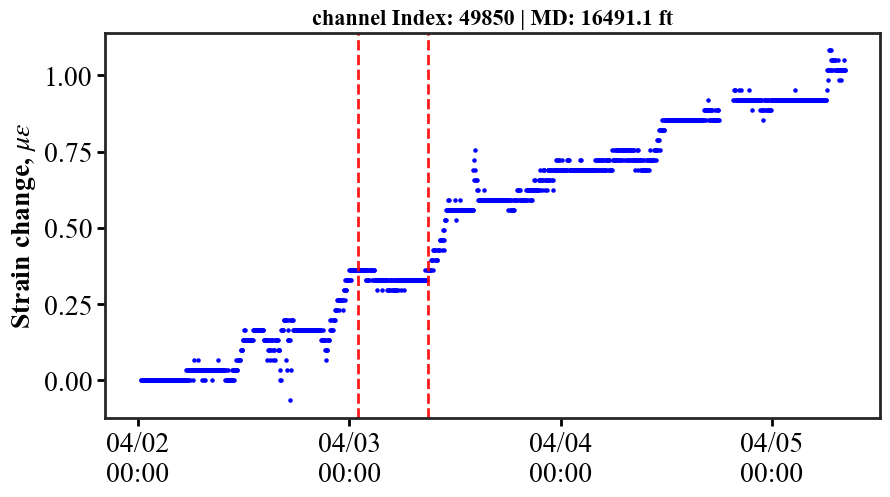

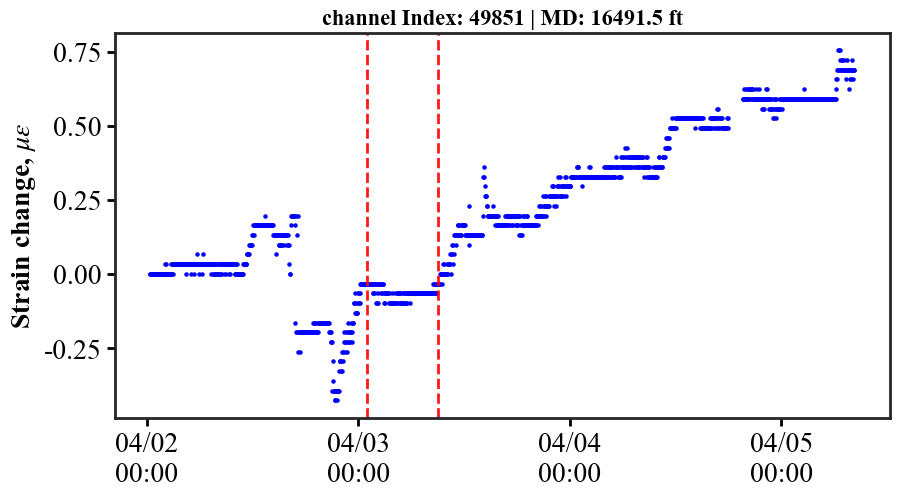

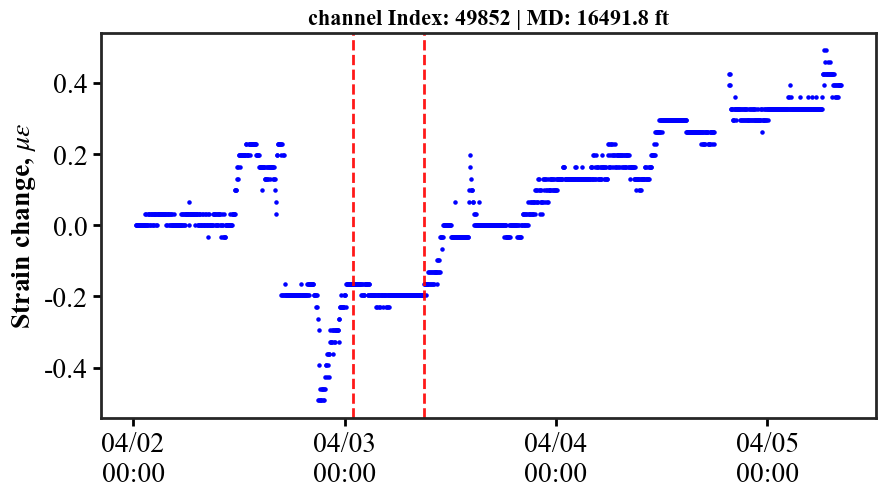

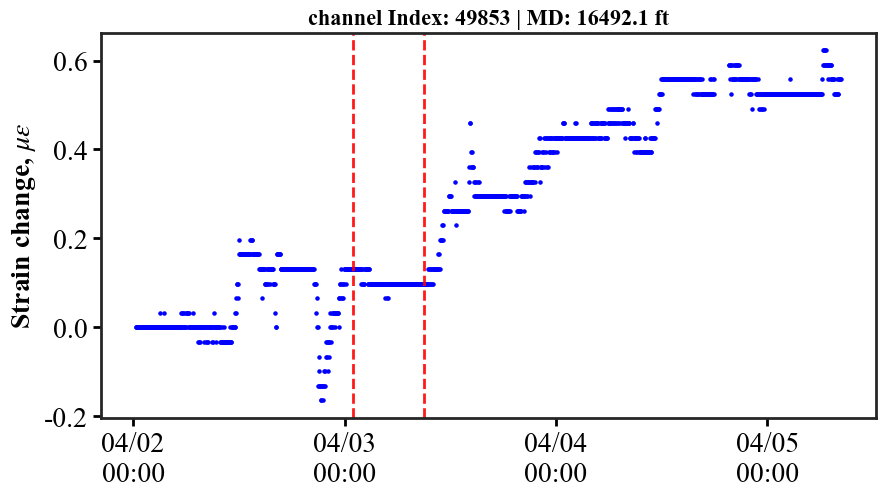

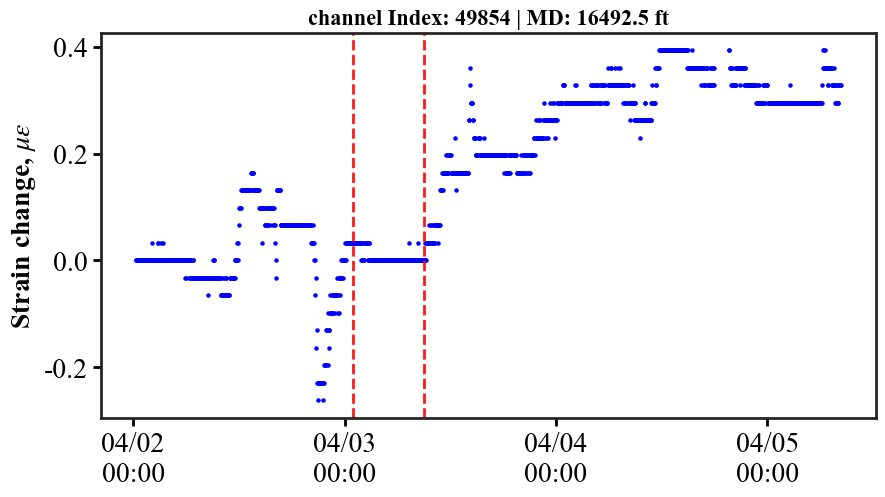

...

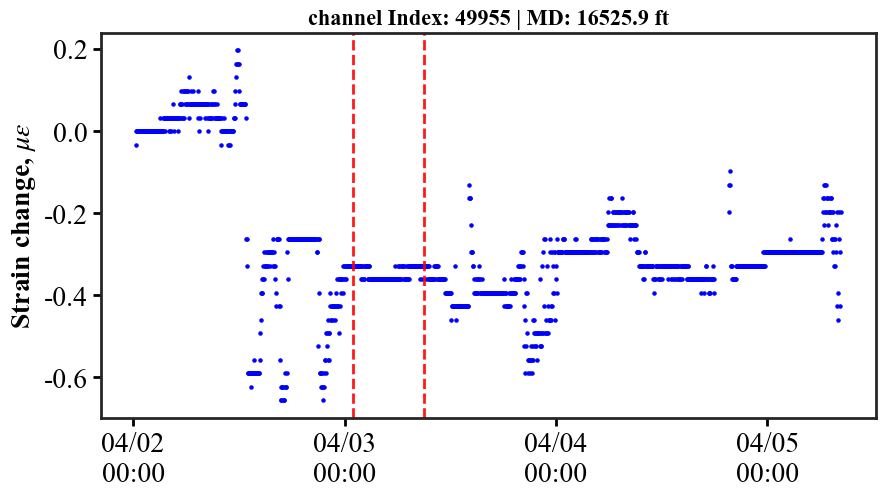

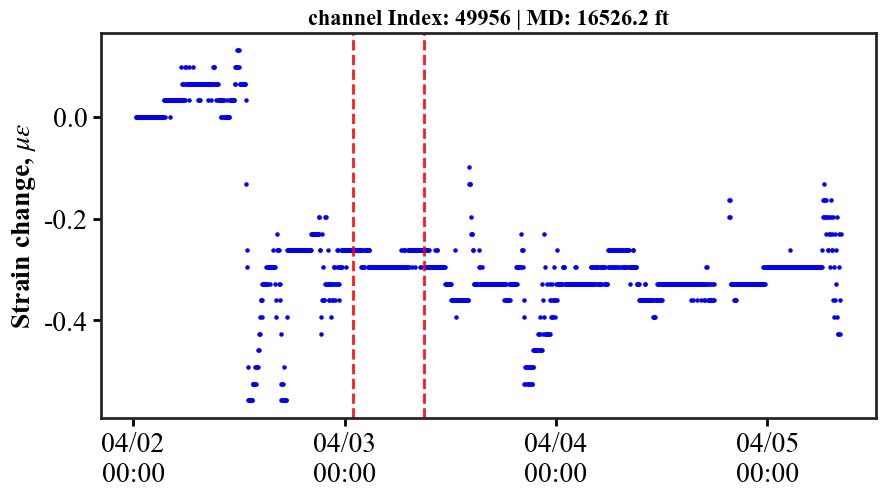

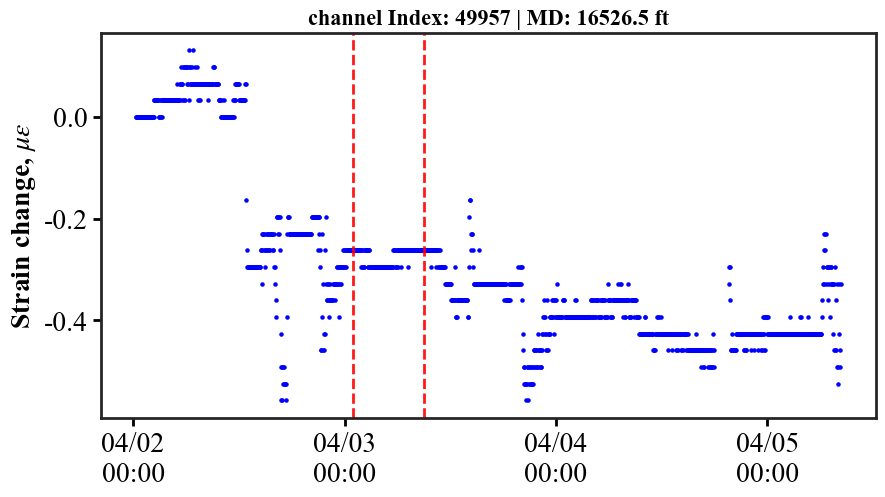

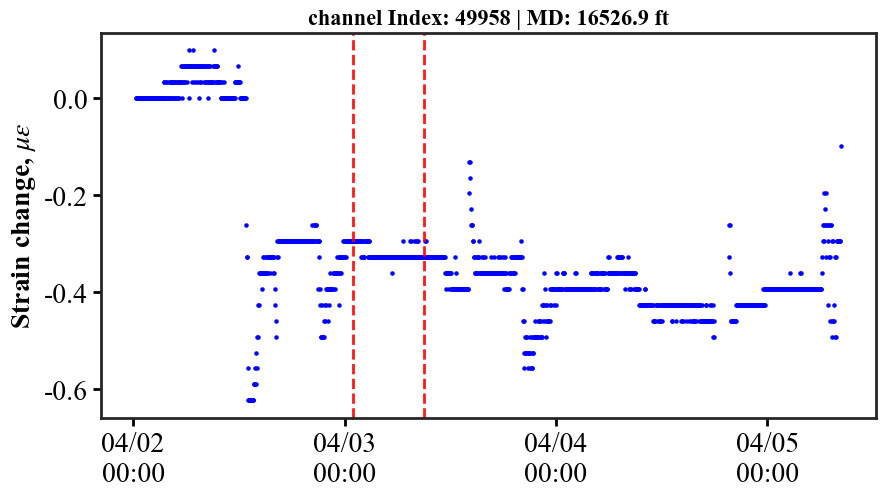

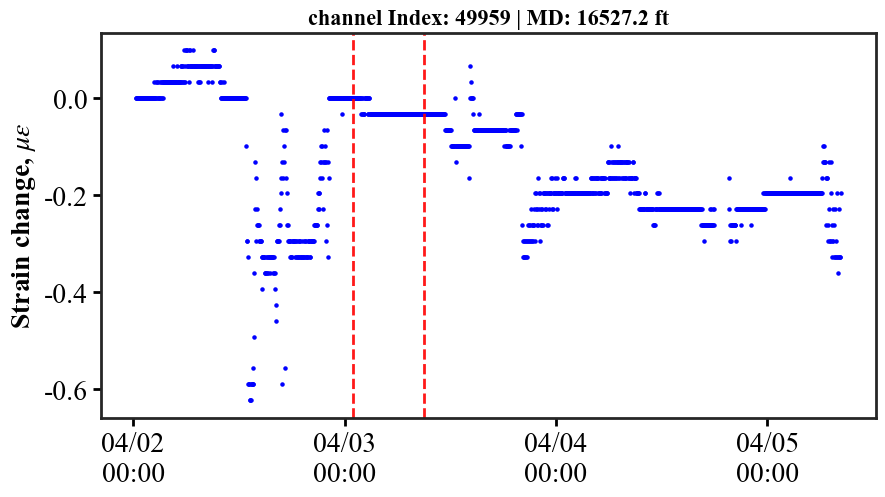

In [31]:

def nearest_col_indices(depth_1d, targets):
    """
    targets 可以是标量或数组。返回与每个 target 最近的列索引。
    """
    t = np.atleast_1d(targets).astype(float)
    # 计算 |depth - target| 并在列轴上取最小
    idx = np.argmin(np.abs(depth_1d[None, :] - t[:, None]), axis=1)
    return idx

pop_channels = np.array([38394, 38449, 38944, 41251, 41570, 42057, 42069, 42085, 43139, 43170,
                         43221, 43245, 43961, 44955, 45000, 45768, 45809, 46738, 47454, 47650, 49911])

flowback_depth = np.array([12660.7, 12678.9, 12842.0, 13602.8, 13707.7, 13868.5, 13872.4, 13877.7, 14225.1, 14235.4, 
                           14252.2, 14260.2, 14496.4, 14824.2, 14838.8, 15092.2, 15105.7, 15412.1, 15648.3, 15712.8,
                           16458.4])
targets = flowback_depth[2]
targets = 15140

# targets = 13004
print("targets:", targets)
idx = nearest_col_indices(depth, targets)

# if use index directly, comment out the above two lines and uncomment the following line:
idx = [49860]  # 直接指定 channel index（列索引）


depth_near = depth[idx]
err = targets - depth_near

print("targets:    ", targets)
print("idx:        ", idx)
print("depth_near: ", depth_near)
print("error(ft):  ", err)

ds = pd.to_datetime(pd.Series(date_str.astype(str)), format='%m/%d/%Y %H:%M:%S.%f')
# print(type(ds))
# print(ds)

#取部分数据进行绘图

# ---- 3) 设定你要显示的时间段（同一时区！）----
start = pd.Timestamp("2022-04-02 00:10:00")
# end   = pd.Timestamp("2022-03-21 18:30:00")
# end   = pd.Timestamp("2022-03-15 17:00:00")
end   = pd.Timestamp("2022-04-05 08:20:00")



# start = pd.Timestamp("2022-06-02 08:00:00")
# end   = pd.Timestamp("2022-06-02 16:00:00")
# end   = pd.Timestamp("2022-06-03 08:00:00")

# start = datetime.datetime(2022, 3, 15, 9, 0)
# end = datetime.datetime(2022, 3, 15, 17, 0)
# end   = datetime.datetime(2022, 3, 21, 19, 0)

mask = (ds >= start) & (ds <= end)
# mask = np.ones(len(ds), dtype=bool)
t_sel    = ds[mask]
print(mask)
# idx 是数组 -> 先变标量
idx0 = int(idx[0])   # 或者 idx0 = int(np.squeeze(idx))

for i in range(-10, 100, 1):   # -50 到 +50
    idx_new = idx0  + i 
        # 防止越界（很重要）
    if idx_new < 0 or idx_new >= depth.size:
        continue
    depth_ft = float(depth[idx_new])  # 该 channel 对应的深度(ft)

    cols = dstrain[:, idx_new]                 # shape = (N_time, len(targets)) 
    cols = 1 * cols
    # print("idx-i:", idx-i)
    # length = len(cols)
    # print(f"读取 {length} 条记录")
    # print("cols", cols)

    strian_sel = cols[mask]
    strian_sel = strian_sel - strian_sel[0]  # 以起始点为零点
    fig, ax = plt.subplots(figsize=(10,5))

    #   scatter plot
    ax.scatter(t_sel, strian_sel, color='blue', s=5, label='Field Pressure Data')
    # ax.plot(t_sel, strian_sel, color='blue', lw = 2, label='Field Pressure Data')

    ax.xaxis_date()
    date_format = mdates.DateFormatter('%m/%d\n%H:%M')
    ax.xaxis.set_major_formatter(date_format)
    # 设置主刻度间隔为 1 小时
    # ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
    #图例显示index
    # ax.set_title(f'channel Index: {idx_new}', fontsize=16, fontweight='bold')
    #  标题同时显示 index + 深度
    ax.set_title(f'channel Index: {idx_new} | MD: {depth_ft:.1f} ft', fontsize=16, fontweight='bold')
    ax.set_ylabel(r'Strain change, $\mu\varepsilon$')
    
    t1 = pd.to_datetime("2022-04-03 01:00:00")
    t2 = pd.to_datetime("2022-04-03 09:00:00")
 

    ax.axvline(t1, linestyle="--", linewidth=2, alpha=0.9, color='red')
    ax.axvline(t2, linestyle="--", linewidth=2, alpha=0.9, color='red')

    



## mark